**<h1> Manipulating Images </h1>**


Estimated time needed: **30** minutes


<h2>Objectives</h2>


In this lab, you will learn how to manipulate images, OpenCV image Arrays. You will learn how to copy an image to avoid aliasing. We will cover flipping images and cropping images. You will also learn to change pixel images; this will allow you to draw shapes, write text and superimpose images over other images.


<ul>
    <li><a href='#MI'>Manipulating Images </a>
        <ul>
            <li>Copying Images  </li>
            <li>Fliping Images </li>
            <li>Cropping an Image </li>
            <li>Changing Specific Image Pixels </li>
     
  
    
</ul>


----


Download the images for the lab


In [1]:
!curl "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/cat.png" -o cat.png

!curl "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png" -o lenna.png

!curl "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png" -o baboon.png


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:03 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:04 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:05 --:--:--     0
  2  647k    2 15461    0     0   2668      0  0:04:08  0:00:05  0:04:03  3108
  7  647k    7 49152    0     0   7012      0  0:01:34  0:00:07  0:01:27  9590
  9  647k    9 65536    0     0   8264      0  0:01:20  0:00:07  0:01:13 14200
 12  647k   12 81920    0     0   8934      0  0:01:14  0:00:09  0:01:05 16263
 14  647k   14 98304    0     0  10030      0  0:01

We will be using these imported functions in the lab


In [2]:
import matplotlib.pyplot as plt # thư viện hiển thị ảnh
import cv2 # thư viện xử lý ảnh
import numpy as np # thư viện toán học

## Copying Images


If you want to reassign an array to another variable, you should use the `copy` method. If we do not apply the method `copy()`, the variable will point to the same location in memory. Consider the following array:


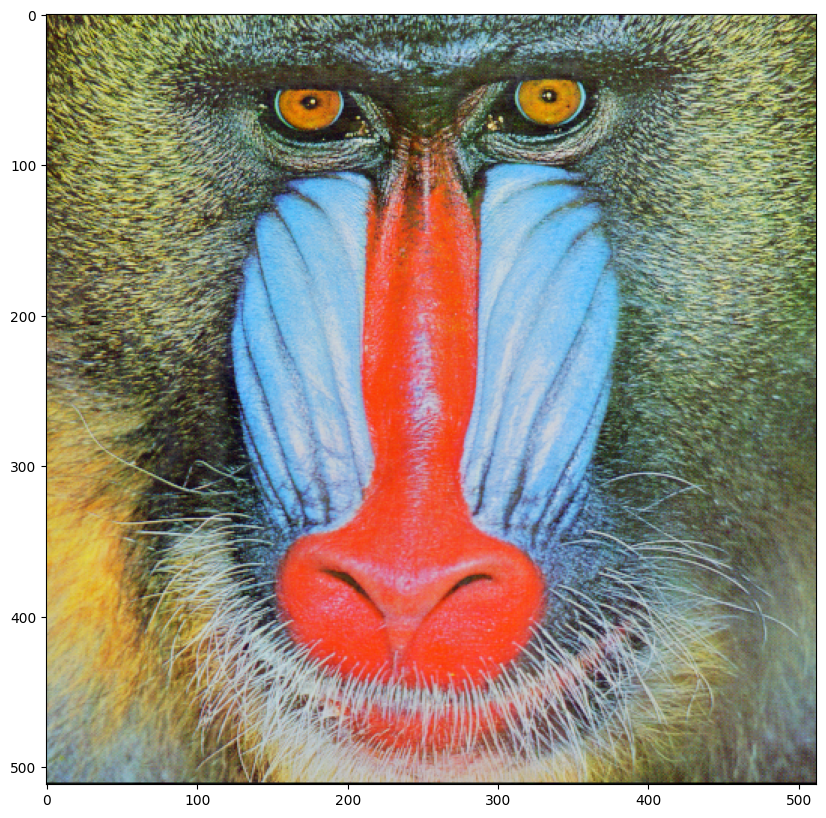

In [3]:
baboon = cv2.imread("baboon.png") 
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB)) 
plt.show()

If we do not apply the method `copy()`, the new variable will point to the same location in memory:


In [4]:
A = baboon # gán ảnh cho biến A

we use the `id` function to find the object's memory address; we see it is the same as the original array.


In [5]:
id(A)==id(baboon) 
id(A) 

2153730973808

If we apply the method `copy()</coode>, the memory address is different 


In [6]:
B = baboon.copy() 
id(B)==id(baboon) 

False

When we do not apply the method <code>copy()</code>, the variable will point to the same location in memory. Consider the array <code>baboon</code>, if we set all its values to zero, then all the values in <code>A</code> will be zero. This is because <code>baboon</code> and <code>A</code> point to the same place in memory, but <code>B</code> will not be affected. 


In [7]:
baboon[:,:,] = 0 

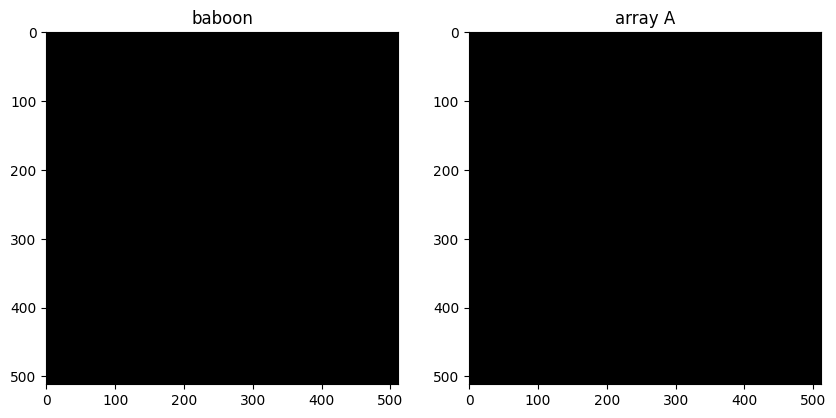

In [8]:
plt.figure(figsize=(10,10)) # hiển thị ảnh 
plt.subplot(121)
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB)) # hiển thị ảnh sử dụng matplotlib 
plt.title("baboon")
plt.subplot(122)
plt.imshow(cv2.cvtColor(A, cv2.COLOR_BGR2RGB)) # hiển thị ảnh A sử dụng matplotlib
plt.title("array A")
plt.show()

We see they are the same, this is called aliasing. Aliasing happens whenever one variable's value is assigned to another variable because variables are just names that store references to values. We can also compare <code>baboon</code> and array <code>B</code>:


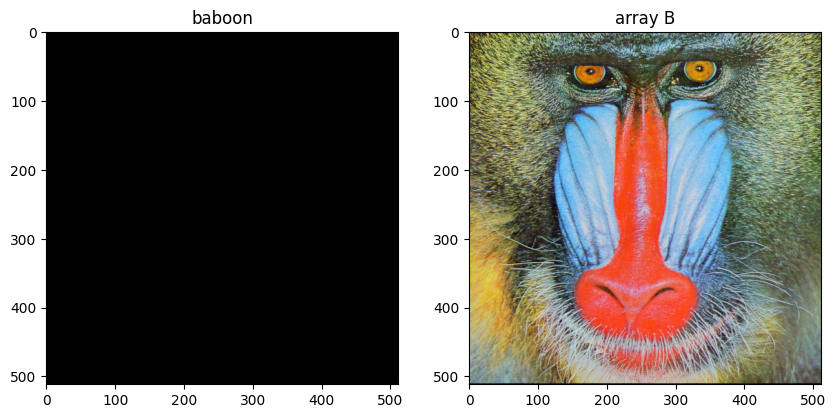

In [9]:
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB)) # hiển thị ảnh sử dụng matplotlib 
plt.title("baboon")
plt.subplot(122)
plt.imshow(cv2.cvtColor(B, cv2.COLOR_BGR2RGB)) # hiển thị ảnh B sử dụng matplotlib 
plt.title("array B")
plt.show()


They are different because they used the method copy.


## Fliping Images 


Flipping images involves reordering the index of the pixels such that it changes the orientation of the image. Consider the following image:


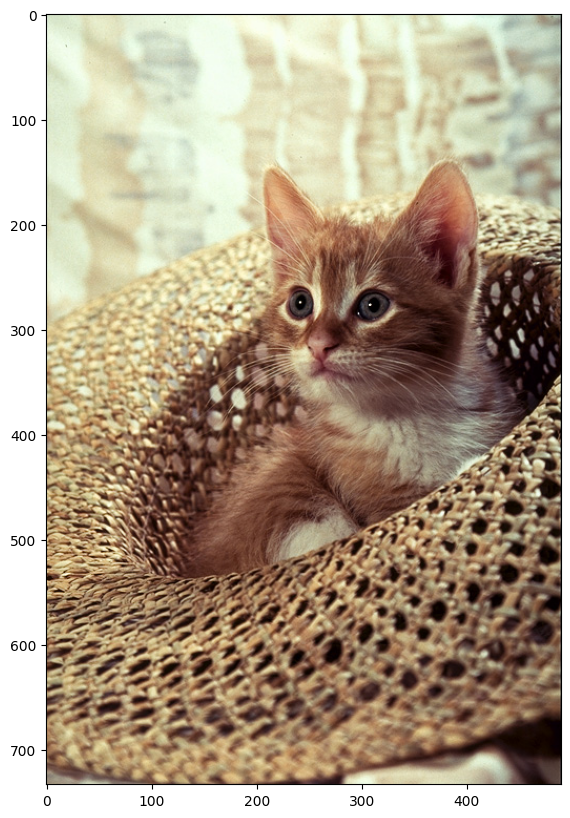

In [10]:
image = cv2.imread("cat.png")
plt.figure(figsize=(10,10)) # hiển thị ảnh
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)) # hiển thị ảnh cat sử dụng matplotlib 
plt.show()

We can cast it to an array and find the shape:


In [11]:
width, height,C=image.shape
print('width, height,C',width, height,C) # in ra kích thước ảnh

width, height,C 733 490 3


Let's Flip i.e rotate it vertically. First, we create an array of equal size of type <code>np.uint8</code> bit image.


In [12]:
array_flip = np.zeros((width, height,C),dtype=np.uint8) # tạo một mảng numpy có cùng kích thước với ảnh ban đầu để lưu sau khi lật ngang

We assign the first row of pixels of the original array to the new array's last row. We repeat the process for every row, incrementing the row number for the original array and decreasing the new array's row index assigning the pixels accordingly.


In [13]:
for i,row in enumerate(image):
        array_flip[width-1-i,:,:]=row # lật ngang ảnh bằng cách gán các hàng của ảnh ban đầu vào mảng mới từ dưới lên trên

We plot the results


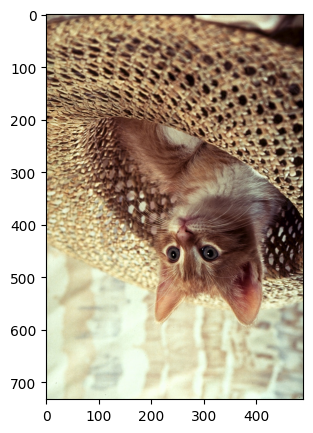

In [14]:
plt.figure(figsize=(5,5))
plt.imshow(cv2.cvtColor(array_flip, cv2.COLOR_BGR2RGB)) # hiển thị ảnh đã lật ngang sử dụng matplotlib 
plt.show()

<code>OpenCV</code>has several ways to flip an image, we can use  the <code>flip()</code> function; we have the input image array. The parameter is the <code>flipCode</code>

is the value indicating what kind of flip we would like to perform; 
<li><code>flipcode</code> = 0: flip vertically around the x-axis</li>
<li><code>flipcode</code> > 0: flip horizontally around y-axis positive value</li>
<li><code>flipcode</code>&#60 0: flip vertically and horizontally, flipping around both axes negative value</li>
Let apply different <code>flipcode</code>'s in a loop:


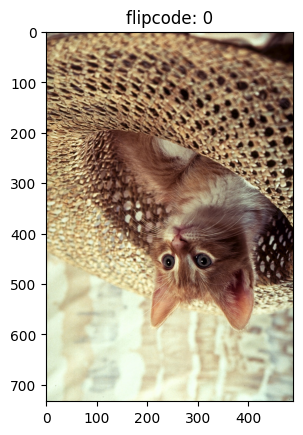

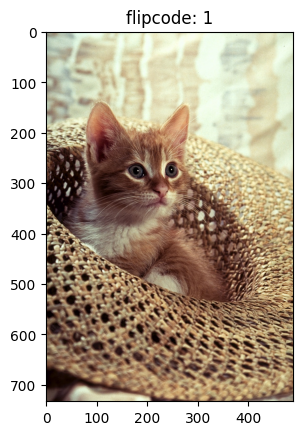

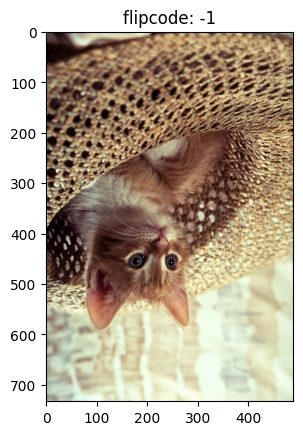

In [15]:
for flipcode in [0,1,-1]:
    im_flip =  cv2.flip(image,flipcode ) # lật ảnh sử dụng hàm cv2.flip() với các giá trị flipcode khác nhau
    plt.imshow(cv2.cvtColor(im_flip,cv2.COLOR_BGR2RGB)) # hiển thị ảnh đã lật sử dụng matplotlib 
    plt.title("flipcode: "+str(flipcode)) # hiển thị tiêu đề với giá trị flipcode
    plt.show()

We can also use the <code>rotate()</code> function. The parameter is an integer indicating what kind of flip we would like to perform. 


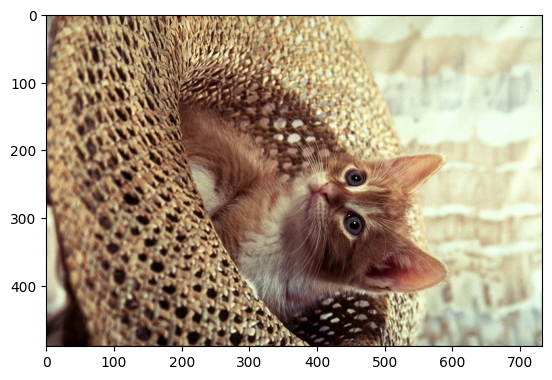

In [16]:
im_flip = cv2.rotate(image,0) # xoay ảnh sử dụng hàm cv2.rotate() 
plt.imshow(cv2.cvtColor(im_flip,cv2.COLOR_BGR2RGB)) # hiển thị ảnh đã xoay sử dụng matplotlib 
plt.show() # hiển thị ảnh

OpenCV module has built-in attributes the describe the type of flip, the values are just integers. Several are shown in the following <code>dict</code>:


In [17]:
flip = {"ROTATE_90_CLOCKWISE":cv2.ROTATE_90_CLOCKWISE,"ROTATE_90_COUNTERCLOCKWISE":cv2.ROTATE_90_COUNTERCLOCKWISE,"ROTATE_180":cv2.ROTATE_180}  # từ điển chứa các mã xoay và tên tương ứng

We see the keys are just an integer


In [18]:
flip["ROTATE_90_CLOCKWISE"]  # truy cập mã xoay 90 độ theo chiều kim đồng hồ

0

We can plot each of the outputs using the different  parameter values 


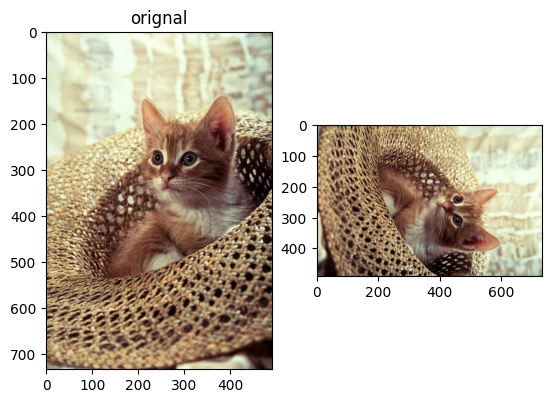

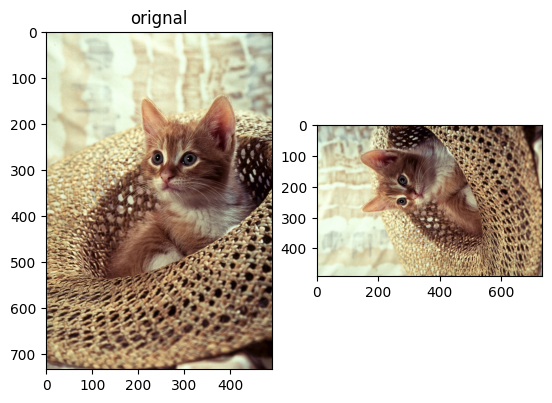

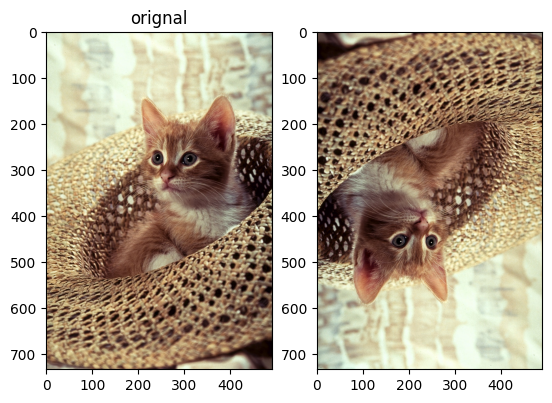

In [19]:
for key, value in flip.items():
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)) # hiển thị ảnh ban đầu sử dụng matplotlib 
    plt.title("orignal")
    plt.subplot(1,2,2)
    plt.imshow(cv2.cvtColor(cv2.rotate(image,value), cv2.COLOR_BGR2RGB)) # hiển thị ảnh đã xoay sử dụng matplotlib 
    plt.show()

 ## Cropping an Image


Cropping is "cutting out" the part of the image and throwing out the rest; we can crop using arrays. Let start with a vertical crop; the variable <code>upper</code> is the first row that we would like to include in the image, the variable <code>lower</code> is the last row we would like to include. We then use slicing to obtain the new image. 


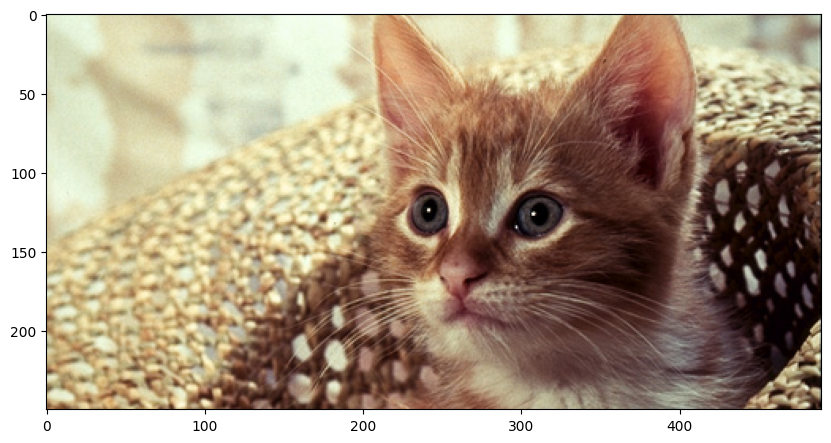

In [20]:
upper = 150
lower = 400
crop_top = image[upper: lower,:,:] # cắt ảnh từ hàng upper đến hàng lower
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(crop_top, cv2.COLOR_BGR2RGB)) # hiển thị ảnh đã cắt sử dụng matplotlib
plt.show()

consider the array <code>crop_top</code> we  can also crop horizontally  the variable right is the first column that we would like to include in the image, the variable left is the last column we would like to include in the image.


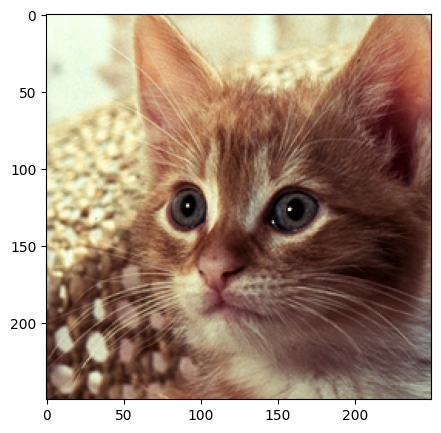

In [21]:
left = 150
right = 400
crop_horizontal = crop_top[: ,left:right,:] # cắt ảnh từ cột left đến cột right
plt.figure(figsize=(5,5))
plt.imshow(cv2.cvtColor(crop_horizontal, cv2.COLOR_BGR2RGB)) # hiển thị ảnh đã cắt sử dụng matplotlib 
plt.show()

## Changing Specific Image Pixels


We can change specific image pixels using  array indexing; for example, we can set  all the channels in the original image we cropped to zero :


In [22]:
array_sq = np.copy(image)
array_sq[upper:lower,left:right,:] = 0

We can compare the results to the new image. 


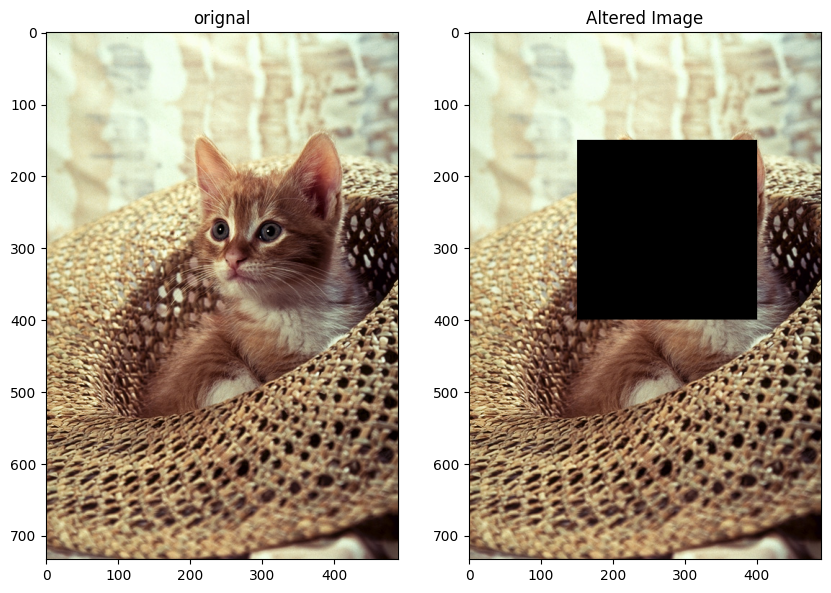

In [23]:
plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB)) # hiển thị ảnh ban đầu sử dụng matplotlib 
plt.title("orignal")
plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(array_sq,cv2.COLOR_BGR2RGB)) # hiển thị ảnh đã chỉnh sửa sử dụng matplotlib 
plt.title("Altered Image")
plt.show()

  We can also create shapes and <code>OpenCV</code>, we can use the method <code>rectangle</code>. The parameter  <code>pt1</code> is the top-left coordinate of the rectangle: <code>(left,top)</code> or $(x_0,y_0)$, <code>pt2</code> is the bottom right coordinate<code>(right,lower)</code> or $(x_1,y_1)$. The parameter <code>color</code>  is a tuple representing the intensity of each channel <code>( blue, green, red)</code>. Finally, we have the line thickness.


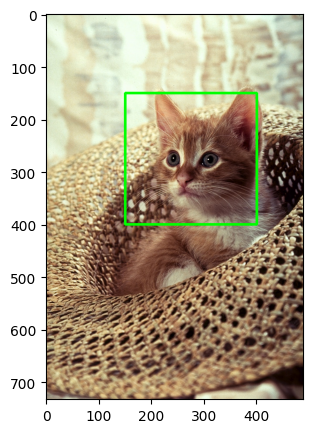

In [24]:
start_point, end_point = (left, upper),(right, lower)
image_draw = np.copy(image)
cv2.rectangle(image_draw, pt1=start_point, pt2=end_point, color=(0, 255, 0), thickness=3) # vẽ hình chữ nhật lên ảnh sao chép với màu xanh lá và độ dày 3 pixel
plt.figure(figsize=(5,5))
plt.imshow(cv2.cvtColor(image_draw, cv2.COLOR_BGR2RGB)) # hiển thị ảnh đã vẽ hình chữ nhật sử dụng matplotlib 

We can overlay text on an image using the function  <code>putText</code> with the following parameter values:



 <li><code>img</code>: Image array </li>
<li><code>text</code>: Text string to be overlayed</li>
<li><code>org</code>: Bottom-left corner of the text string in the image</li>
<li><code>fontFace</code>: tye type of font </li>
<li><code>fontScale</code>: Font scale</li>
<li><code>color</code>: Text color</li>
<li><code>thickness</code>: Thickness of the lines used to draw a text</li>
<li><code>lineType:</code> Line type</li>


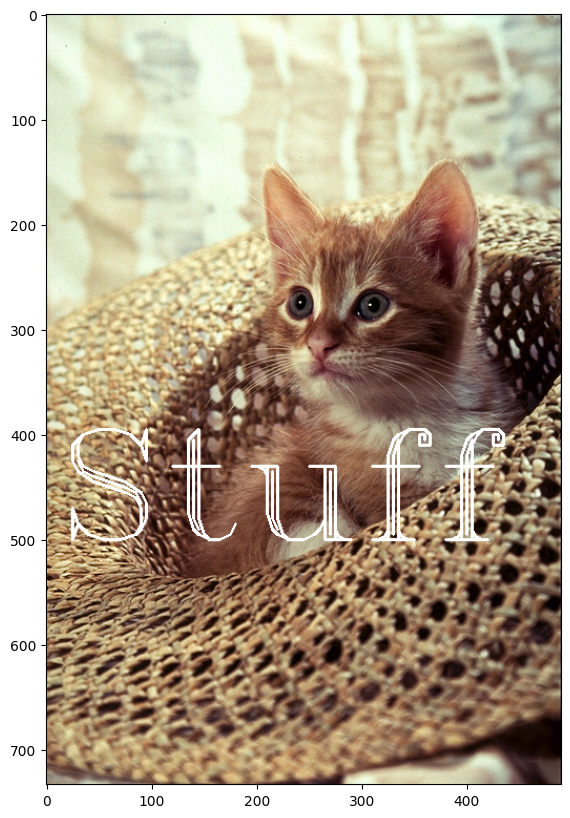

In [25]:
image_draw=cv2.putText(img=image,text='Stuff',org=(10,500),color=(255,255,255),fontFace=4,fontScale=5,thickness=2) # thêm văn bản "Stuff" vào ảnh với các thuộc tính đã chỉ định
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(image_draw,cv2.COLOR_BGR2RGB)) # hiển thị ảnh đã thêm văn bản sử dụng matplotlib
plt.show()

### Question-4: 
Use the image baboon.png from this lab or take any image you like.

Open the image and create a OpenCV Image object called `im`, convert the image from BGR format to RGB format, flip `im` vertically around the x-axis and create an image called `im_flip`, mirror `im` by flipping it horizontally around the y-axis and create an image called `im_mirror`, finally plot both images


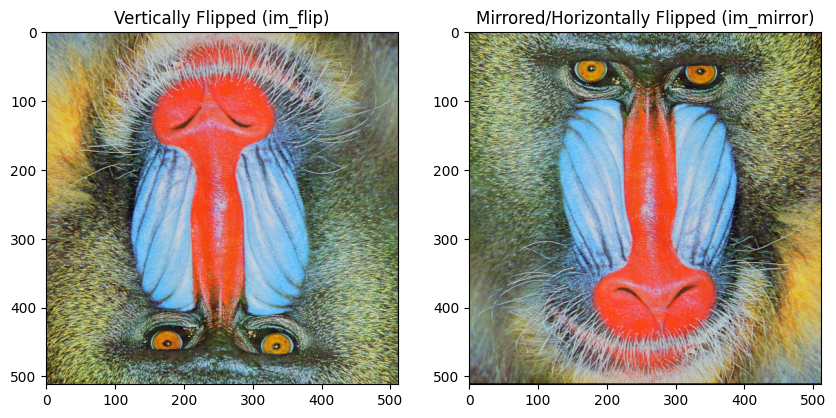

In [26]:
import cv2
import matplotlib.pyplot as plt

im = cv2.imread("baboon.png")
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
im_flip = cv2.flip(im, 0)
im_mirror = cv2.flip(im, 1)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(im_flip)
plt.title("Vertically Flipped (im_flip)")

plt.subplot(1, 2, 2)
plt.imshow(im_mirror)
plt.title("Mirrored/Horizontally Flipped (im_mirror)")

plt.show()

Double-click **here** for a hint.

<!-- The hint is below:

im_flip =  cv2.flip(baboon,0)
im_mirror =  cv2.flip(baboon, 1)

-->


Double-click **here** for the solution.

<!-- The answer is below:

im = cv2.imread("baboon.png")

im_flip =  cv2.flip(im, 0)
plt.imshow(cv2.cvtColor(im_flip, cv2.COLOR_BGR2RGB))
plt.show()

im_mirror =  cv2.flip(im, 1)
plt.imshow(cv2.cvtColor(im_mirror, cv2.COLOR_BGR2RGB))
plt.show()

-->


# References 


[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).


<!--<h2>Change Log</h2>-->


<!--
<table>
    <tr>
        <th>Date (YYYY-MM-DD)</th>
        <th>Version</th>
        <th>Changed By</th>
        <th>Change Description</th>
    </tr>
    <tr>
        <td>2020-07-20</td>
        <td>0.2</td>
        <td>Azim</td>
        <td>Modified Multiple Areas</td>
    </tr>
    <tr>
        <td>2020-07-17</td>
        <td>0.1</td>
        <td>Azim</td>
        <td>Created Lab Template</td>
    </tr>
    <tr>
        <td>2021-03-06</td>
        <td>0.3</td>
        <td>Nayef</td>
        <td>Modified some codes</td>
    </tr>
</table>
-->


<h3 align="center"> &#169; IBM Corporation. All rights reserved. <h3/>
